# Notes on filtering and image processing
#### Computational Methods for Geoscience - EPS 400/522
#### Instructor: Eric Lindsey

---------

In these notes, we'll explore fourier transforms in 1 and 2 dimensions, and different options for filtering data.

In [89]:
# some useful imports and settings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ipywidgets import interactive
import scipy.fft
import scipy.signal

%config InlineBackend.figure_format = 'retina' # better looking figures on high-resolution screens

# automatically reload modules when running, otherwise jupyter does not notice if our functions have changed
%load_ext autoreload
%autoreload 2

# not used in this lab:

#import netCDF4 as nc
#import datetime
#import scipy.optimize
#import time
#import multiprocessing as mp

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Fourier transforms

The Discrete Fourier Transform or DFT is implemented in Scipy as the function ‘fft’, which stands for ‘Fast Fourier Transform,’ a particular algorithm for computing the DFT quickly. The code below contains the steps needed to set up a DFT of a synthetic signal. In the example, the sampling frequency is set to be much higher than the signal frequency.

### The fourier transform of a sine / cosine wave is a delta function.


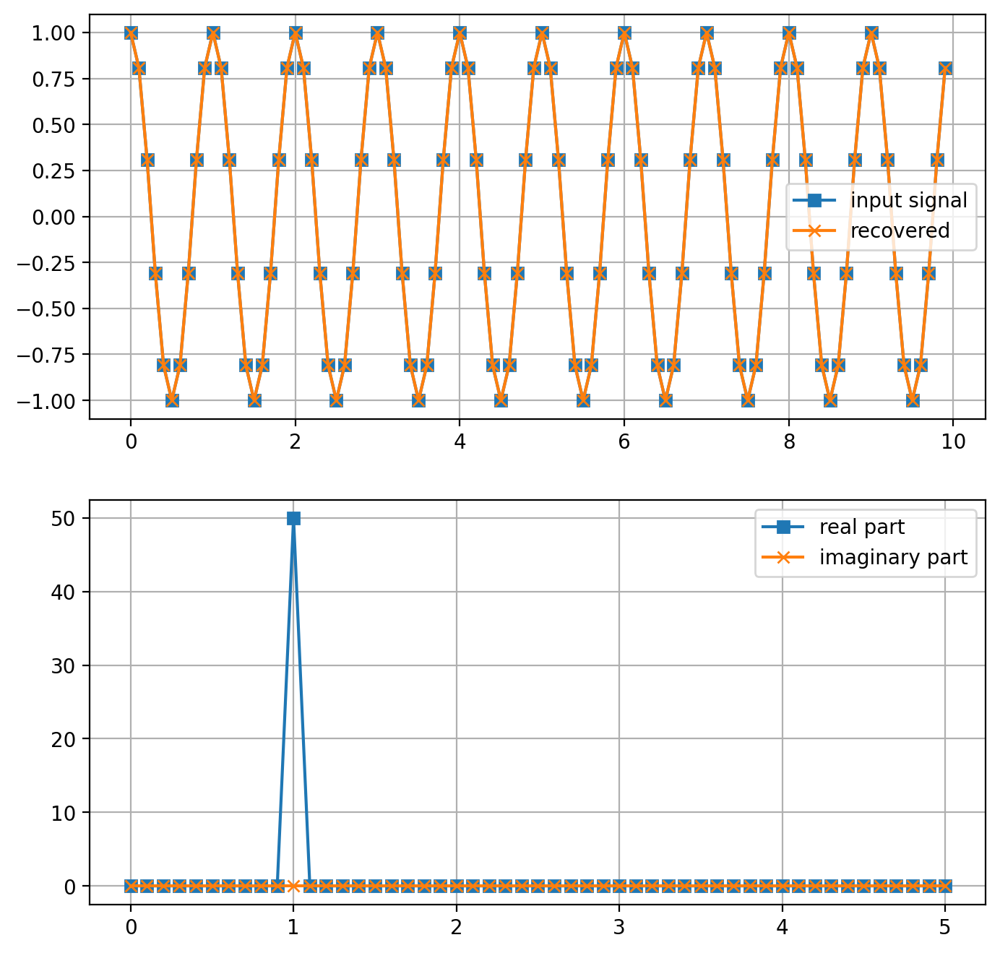

In [101]:
signal_frequency=1
sample_rate=10

# define our sample frequency and signal duration
sample_freq=1/sample_rate # seconds
duration = 10         # seconds
N = int(duration*sample_rate)  # number of samples

# define our time axis
t = np.linspace(0, duration, N, endpoint=False)

# define y
y=np.cos(2*np.pi*t * signal_frequency)

plt.figure(figsize=(8,8))
ax1=plt.subplot(211)
ax1.plot(t,y,'-s',label='input signal')

# compute the rfft of y
yfft = scipy.fft.rfft(y)

# get the frequency values for the fft plot
# input arguments are the number of sample points, and the spacing in time
f = scipy.fft.rfftfreq(N,sample_freq)

ax2=plt.subplot(212)
ax2.plot(f,np.real(yfft),'-s',label='real part')
ax2.plot(f,np.imag(yfft),'-x',label='imaginary part')
ax2.grid()
ax2.legend(loc='upper right')

# compute the inverse fft of y and plot it
yrecovered = np.real(scipy.fft.irfft(yfft,N))

ax1.plot(t,yrecovered,'-x',label='recovered')
ax1.grid()
ax1.legend()

plt.show()



### Using fourier transforms to view the components of a complex signal

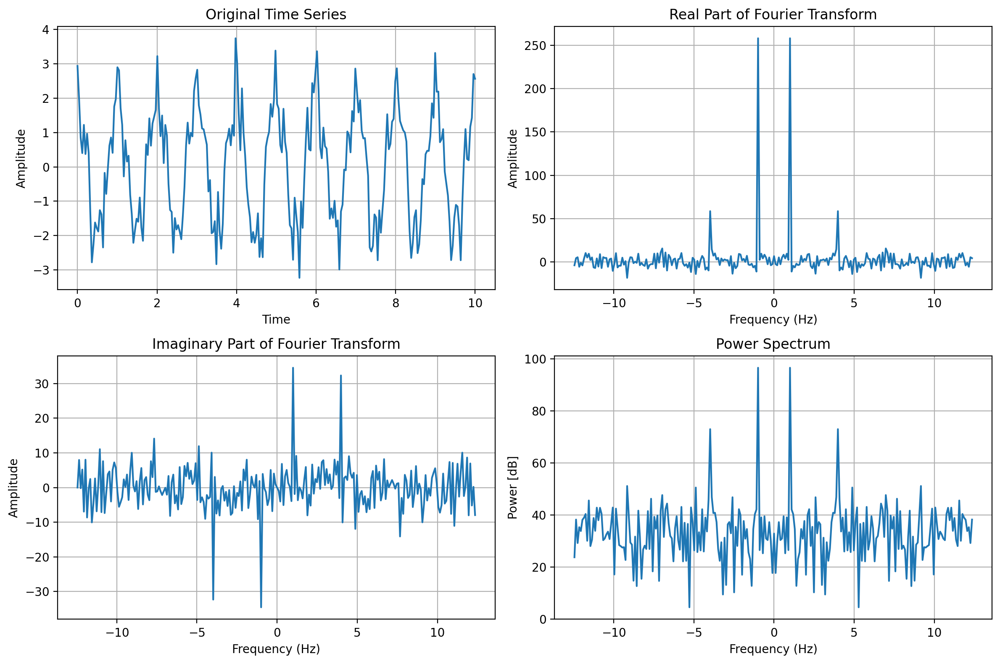

In [102]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Generate synthetic data with periodic components and noise
t = np.linspace(0, 10, 250)  # Time values from 0 to 10 seconds
frequency1 = 1  # Frequency of the first component (in Hz)
frequency2 = 4  # Frequency of the second component (in Hz)
amplitude1 = 2.0  # Amplitude of the first component
amplitude2 = 0.5  # Amplitude of the second component
noise_amplitude = 0.5

# Create synthetic data with two periodic components and noise
sig = amplitude1 * np.cos(2 * np.pi * frequency1 * t) + amplitude2 * np.cos(2 * np.pi * frequency2 * t)
noise = noise_amplitude * np.random.randn(len(t))
data = sig + noise

# Step 2: Compute the Fourier transform of the data
fourier_transform = np.fft.fft(data)
frequencies = np.fft.fftfreq(len(t), d=t[1] - t[0])

# shift the data so the ordering makes sense
data_fft_shift = scipy.fft.fftshift(fourier_transform)
f_shift = scipy.fft.fftshift(frequencies)

# Step 3: Calculate the power spectrum
power_spectrum = np.abs(data_fft_shift)**2
power_spectrum_db = 20 * np.log10(abs(power_spectrum))
# Step 4: Plot the results
plt.figure(figsize=(12, 8))

# Plot the original time series
plt.subplot(2, 2, 1)
plt.plot(t, data)
plt.title("Original Time Series")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.grid()

# Plot the real part of the Fourier transform
plt.subplot(2, 2, 2)
plt.plot(f_shift, np.real(data_fft_shift))
plt.title("Real Part of Fourier Transform")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.grid()

# Plot the imaginary part of the Fourier transform
plt.subplot(2, 2, 3)
plt.plot(f_shift, np.imag(data_fft_shift))
plt.title("Imaginary Part of Fourier Transform")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.grid()

# Plot the power spectrum
plt.subplot(2, 2, 4)
plt.plot(f_shift, power_spectrum_db)
plt.title("Power Spectrum")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power [dB]")
plt.grid()
plt.tight_layout()
plt.show()


Note the only nonzero values occur at the positive and negative frequencies of the signal (which are 1 and 4 hz in this case). The FFT is fully real only for functions which are *even* - symmetric across the y-axis, like cosine. The sine function is *odd*, or inverted across the y-axis, so its fourier transform is fully imaginary and the real part is zero - try it out if you like! 

## Convolutions and filters

The Fourier transform can be a very efficient way to compute a convolution, which we can use for example to filter our data. In python, there are (many!) nice packages that make this quick to program as well. Here is one example using scipy.signal:

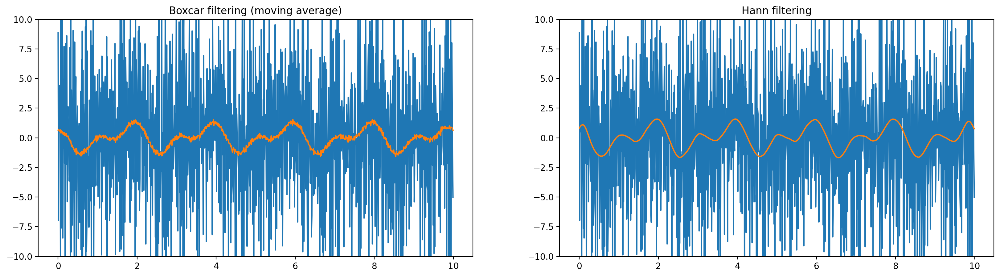

In [105]:
# working with the noisy data file again
dat = pd.read_csv('noisy_data.txt',sep='\s+')
t=np.array(dat['time'])
d=np.array(dat['data'])

# get a 50-point boxcar filter - just a vector of 50 ones
filt1 = np.ones(50)
# the filter must be normalized to have a sum of 1, or it will change our signal amplitude
filt1 = filt1/sum(filt1)
# smooth the data with this filter - option "same" makes sure the output has the same length.
d_filt1 = scipy.signal.convolve(d,filt1,'same')

# get a Hann filter, we'll also set it to be 50 points in length
filt2 = scipy.signal.hann(50)
#normalize:
filt2 = filt2/sum(filt2)
# smooth the data with this filter
d_filt2 = scipy.signal.convolve(d,filt2,'same')

plt.figure(figsize=(20,5))
ax1=plt.subplot(121)
ax1.plot(t,d)
ax1.plot(t,d_filt1)
ax1.set_ylim([-10,10])
ax1.set_title('Boxcar filtering (moving average)')
ax2=plt.subplot(122)
ax2.plot(t,d)
ax2.plot(t,d_filt2)
ax2.set_ylim([-10,10])
ax2.set_title('Hann filtering')
plt.show()


Notice that the Hann filter works much better at suppressing the high frequencies. This is because it has less of the "ringing" effect (sidelobes) compared to the boxcar.

We can plot their response spectra, along with some other common filters:

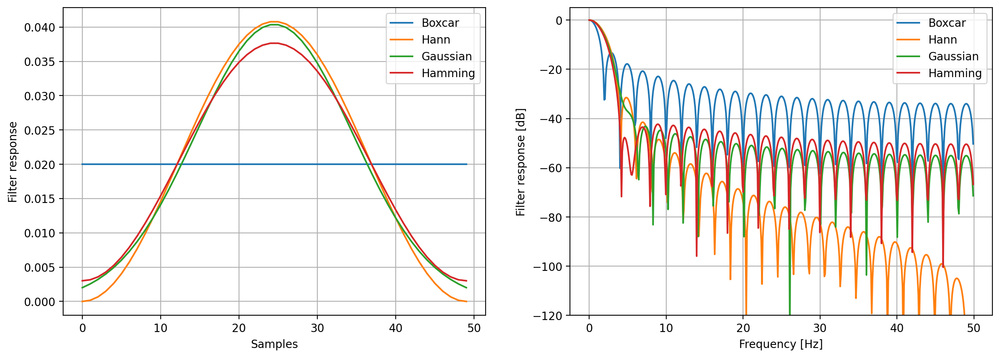

In [106]:
# use 'freqz' to easily get a response spectrum for our filters.
# argument 'fs' is the sample frequency - for this data it is 100 (becasue the sample spacing in our original timeseries is 0.01)
# The formula for decibels is: 20 * log10(abs(amplitude))

# gaussian filter
filt3 = scipy.signal.gaussian(50,10) # second argument is the standard deviation of the gaussian
filt3=filt3/sum(filt3)

# hamming filter
filt4 = scipy.signal.hamming(50)
filt4=filt4/sum(filt4)

plt.figure(figsize=(15,5))
ax1=plt.subplot(121)
ax1.plot(filt1, label='Boxcar')
ax1.plot(filt2, label='Hann')
ax1.plot(filt3, label='Gaussian')
ax1.plot(filt4, label='Hamming')
ax1.legend()
ax1.grid()
ax1.set_ylabel('Filter response')
ax1.set_xlabel('Samples')

ax2=plt.subplot(122)
f,amp = scipy.signal.freqz(filt1,fs=100)
db=20 * np.log10(abs(amp))
ax2.plot(f, db, label='Boxcar')

f,amp = scipy.signal.freqz(filt2,fs=100)
db=20 * np.log10(abs(amp))
ax2.plot(f, db, label='Hann')

f,amp = scipy.signal.freqz(filt3,fs=100)
db=20 * np.log10(abs(amp))
ax2.plot(f, db, label='Gaussian')

f,amp = scipy.signal.freqz(filt4,fs=100)
db=20 * np.log10(abs(amp))
ax2.plot(f, db, label='Hamming')

ax2.grid()
ax2.set_ylabel('Filter response [dB]')
ax2.set_xlabel('Frequency [Hz]')
ax2.legend()
ax2.set_ylim([-120,5])
plt.show()

## 2D FFT

Taking the FFT in 2D is just the same as in 1d, with '2' added to the name of most of our functions. Here's an example showing the FFT of a circular aperture.

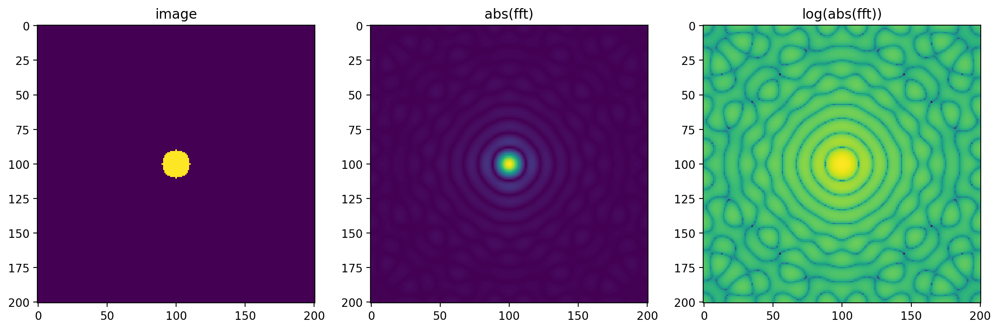

In [107]:
# create X and Y matrices, centered on 0
x=np.linspace(-100,100,201)
[X,Y]=np.meshgrid(x,x)

# make a circular window
# use the X and Y matrices to create a logical array (true inside a circle with radius 10), then multiply by 1.0 to convert to float.
circ=1.0*(X**2 + Y**2 <= 100)

plt.figure(figsize=(15,5))
ax1=plt.subplot(131)
ax1.imshow(circ)
ax1.set_title('image')

# note, we use fftshift to move the values back to the center, otherwise they are located in the corners of the matrix
circ_fft = scipy.fft.fftshift(scipy.fft.fft2(circ))
ax2=plt.subplot(132)
ax2.imshow(abs(circ_fft))
ax2.set_title('abs(fft)')

ax3=plt.subplot(133)
ax3.imshow(np.log10(abs(circ_fft)))
ax3.set_title('log(abs(fft))')

plt.show()

# Image processing

### Install OpenCV

OpenCV (module name 'cv2') is one of the largest and most well-maintained image processing libraries available in Python. 'CV' stands for Computer Vision. If your import statement above gives an error, try running this line in a cell by itself:

conda install -c conda-forge opencv

This will take a few minutes to run, then you can try the import statement again above. If the package was installed successfully but the import still doesn't work, you may need to restart the kernel (from the Kernel menu at the top of the page).

In [108]:
import cv2

### Basic use of OpenCV

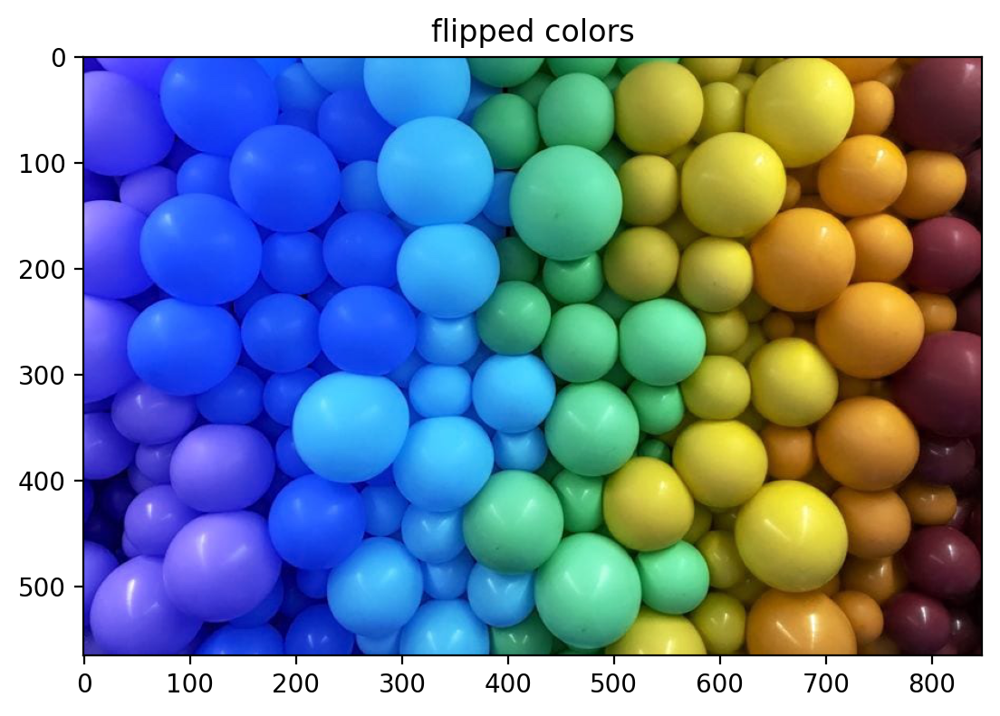

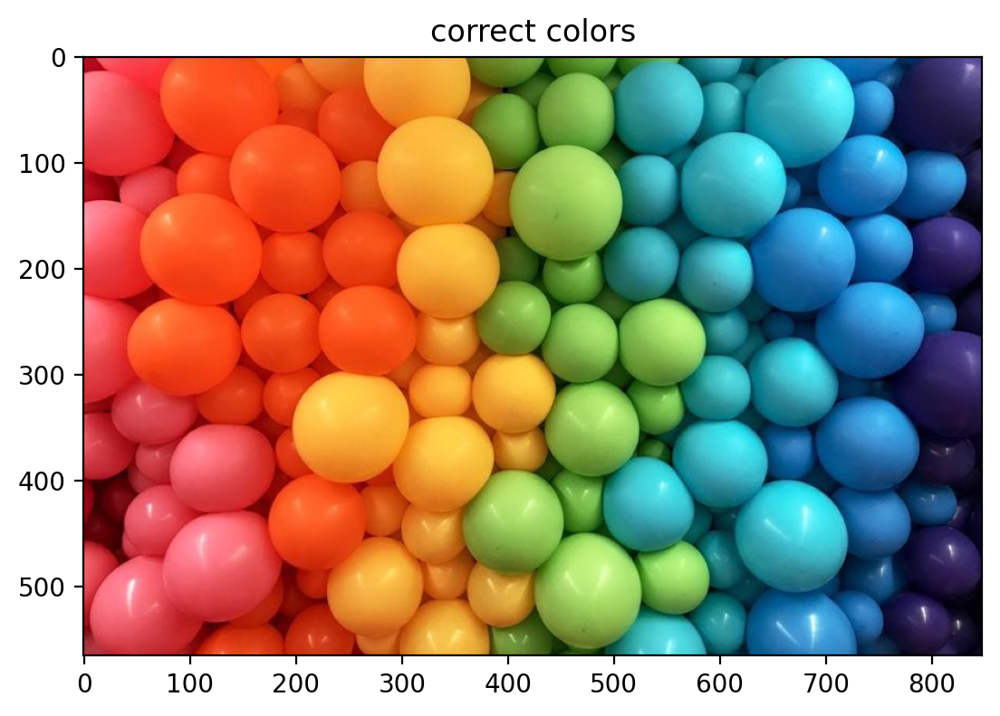

In [109]:
# read in a color image
img = cv2.imread('rainbow.jpg')

# display the image
# use 'imshow' in matplotlib to plot it.
plt.imshow(img)
plt.title('flipped colors')
plt.show()

# WHOOPS... here is a fun python issue. OpenCV stores the 3 bands in the order B,G,R, 
# but matplotlib assigns them to the colors R,G,B. 

# let's split them apart and put them back together in the right order.
b,g,r = cv2.split(img)
img_rgb = cv2.merge((r,g,b))
plt.imshow(img_rgb)
plt.title('correct colors')
plt.show()
# whew, much better!

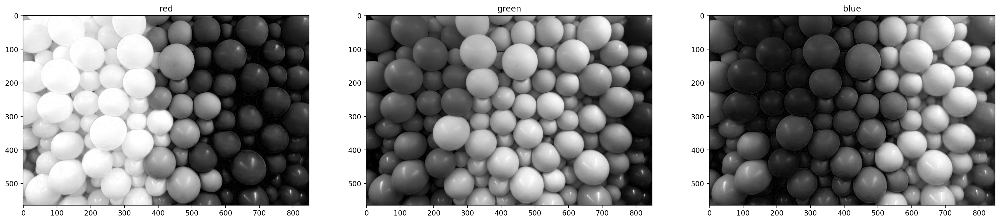

In [110]:
# plot the bands of the image separately
fig,axs = plt.subplots(1,3,figsize=(25,10))
axs[0].imshow(r,cmap='gray')
axs[0].set_title('red')
axs[1].imshow(g,cmap='gray')
axs[1].set_title('green')
axs[2].imshow(b,cmap='gray')
axs[2].set_title('blue')
plt.show()


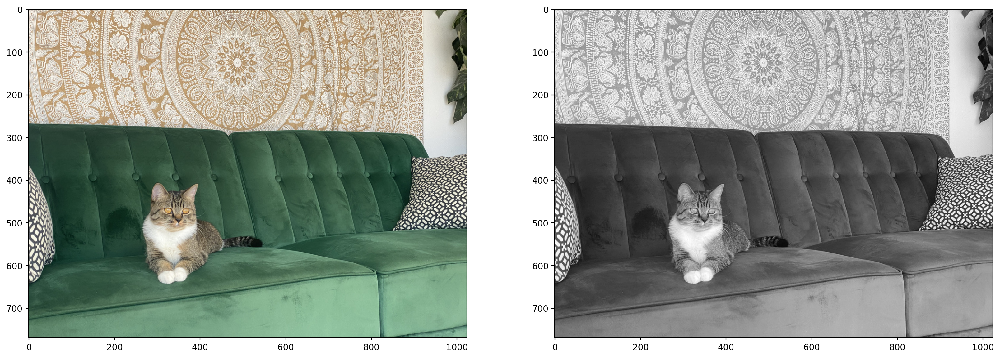

In [113]:
# We can also use the cv2 function 'cvtColor' to reorder the bands, instead of manually.
# Sometimes we also just want to convert the image to grayscale. Let's convert this nice picture of my cat:
cat = cv2.imread('pumpkin.jpg')
cat_rgb = cv2.cvtColor(cat,cv2.COLOR_BGR2RGB)
cat_gray = cv2.cvtColor(cat,cv2.COLOR_BGR2GRAY)

fig,axs = plt.subplots(1,2,figsize=(20,10))
axs[0].imshow(cat_rgb)
axs[1].imshow(cat_gray,cmap='gray')


# write out the grayscale image
cv2.imwrite('pumpkin_gray.jpg',cat_gray)

plt.show()

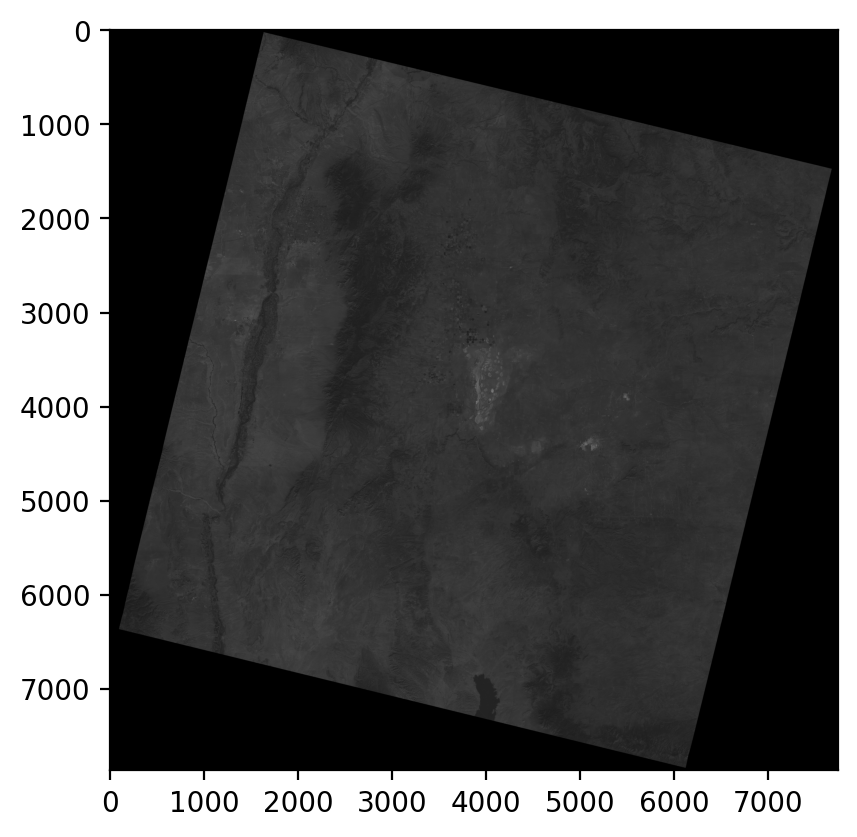

In [118]:
# read some landsat data

ls_b4 = cv2.imread('LC09_L2SP_033036_20231016_20231017_02_T1_SR_B4.TIF')

plt.imshow(ls_b4)

## Filtering

OpenCV makes it easy to apply filters to our image. If it's convolutional, the fourier transform will automatically be used.

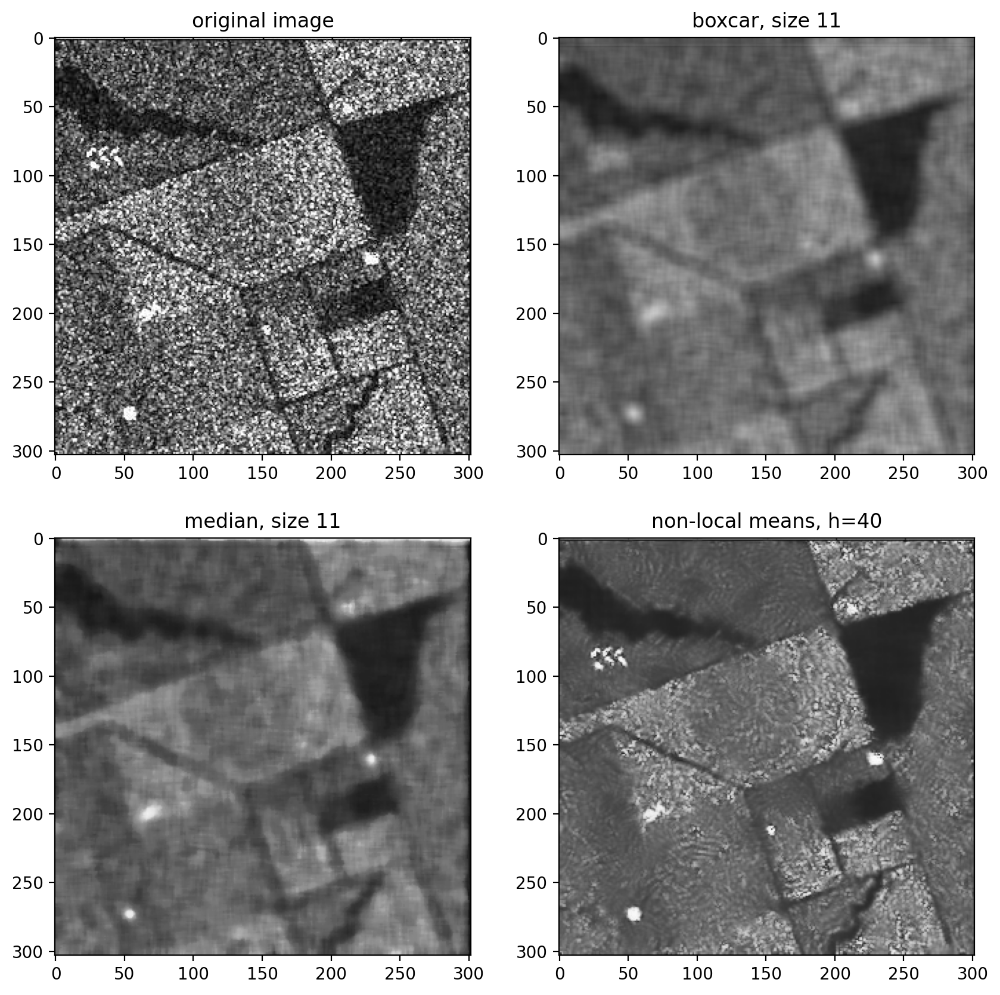

In [114]:
img_speckly = cv2.imread('sar_speckle.png')

fig,axs=plt.subplots(2,2,figsize=(10,10))

# this SAR image is pretty speckled.
axs[0,0].imshow(img_speckly,cmap='gray')
axs[0,0].set_title('original image')

# let's try to filter it with a 9x9 boxcar filter. This can be done easily with cv2.blur(img,(xsize,ysize))
img_blur = cv2.blur(img_speckly,(11,11))
axs[0,1].imshow(img_blur,cmap='gray')
axs[0,1].set_title('boxcar, size 11')

# that's not great, what about a median filter?
img_median = cv2.medianBlur(img_speckly,11)
axs[1,0].imshow(img_median,cmap='gray')
axs[1,0].set_title('median, size 11')

# OpenCV has some much more advanced options - let's try one out!
img_denoise = cv2.fastNlMeansDenoising(img_speckly,h=40) 
axs[1,1].imshow(img_denoise,cmap='gray')
axs[1,1].set_title('non-local means, h=40')
# pretty nice! Much sharper than the boxcar or median filters. Although it might be making up some texture?

plt.show()


## Image thresholding and connected components



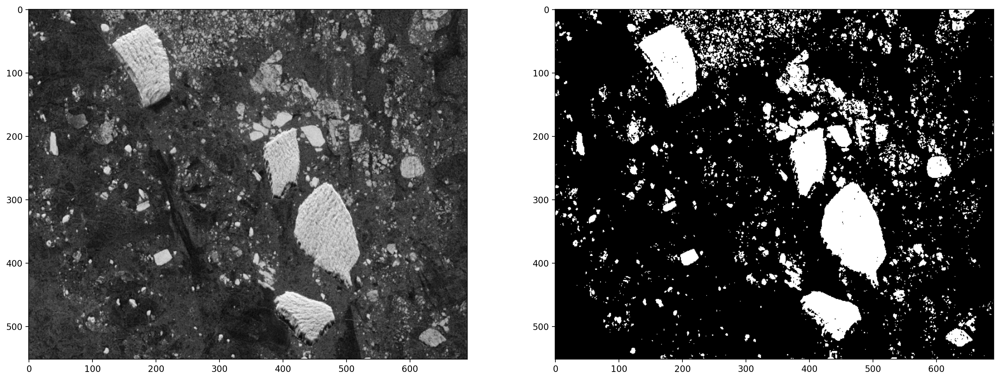

In [115]:
# load the (grayscale) image and make a plot
img = cv2.imread('iceye_icebergs.png')
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
fig,axs = plt.subplots(1,2,figsize=(20,10))
axs[0].imshow(img_gray,cmap='gray')

# threshold the image at a grayscale value of 127 (halfway through the range).
# we also have to specify the "threshold type", which here is cv2.THRESH_BINARY
# finally, notice that there are 2 outputs of this function - the threshold value and the image.
# see a nice tutorial here: https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html
thres_value, img_binary = cv2.threshold(img_gray,127,255,cv2.THRESH_BINARY)
axs[1].imshow(img_binary,cmap='gray')
plt.show()

identified 2176 icebergs
7 are larger than the min size of 1000


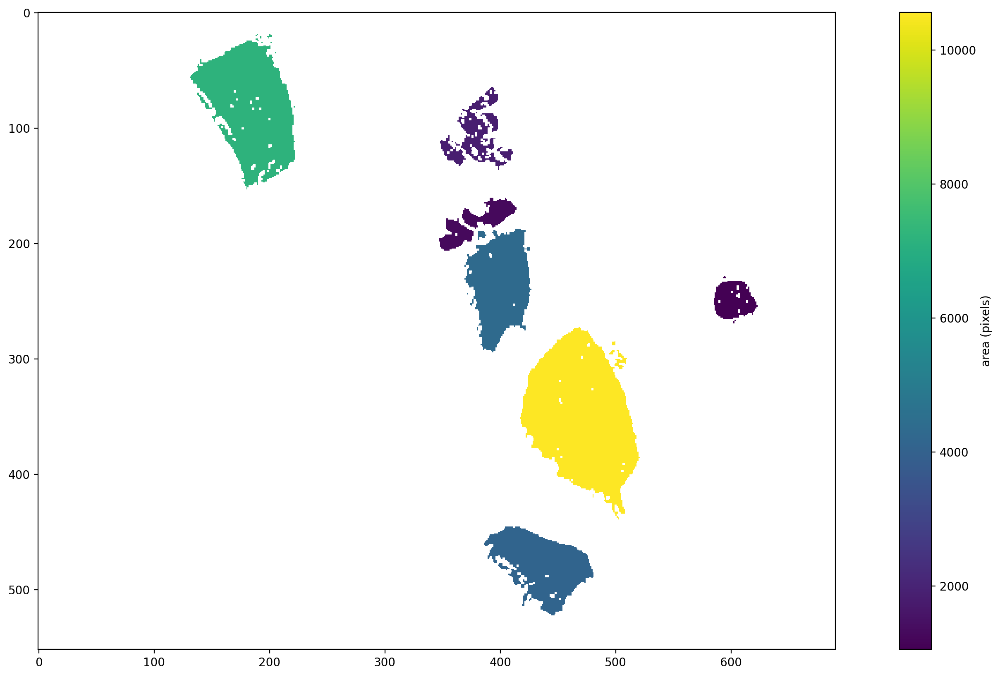

In [116]:
# now apply the segmentation
# based (in part) on a long tutorial here: 
# https://pyimagesearch.com/2021/02/22/opencv-connected-component-labeling-and-analysis/

# this value defines what is "connected" - it is either 4 (edges only) or 8 (diagonals OK)
connectivity = 4 

# get the connected components:
numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(img_binary, connectivity, cv2.CV_32S)

# how many did we find?
print('identified', numLabels, 'icebergs')

# loop over the components, and if their areas are above the required size, add them to the map.
minArea = 1000
mask=np.zeros(np.shape(img_binary))
count=0
for i in range(numLabels):
    area = stats[i,cv2.CC_STAT_AREA]
    # note, we skip label 1 because this is the largest - usually the background of the image!
    if i>0 and area > minArea:
        #componentMask = (labels == i).astype("uint8") * 255
        #mask = cv2.bitwise_or(mask, componentMask)
        count += 1
        object_mask = (labels == i)
        mask[object_mask] = area
        
# make any areas that are still zero into nan, for a white background:
mask[mask==0] = np.nan

print(count, 'are larger than the min size of',minArea)
plt.figure(figsize=(20,10))
plt.imshow(mask)
plt.colorbar(label='area (pixels)')
plt.show()
